Supervised Machine Learning Attempt:
    -Predicting the Winner provided the data 
    -Looking to learn from the data in the CSV file to predict the winner

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np
import random

# Load your data
df = pd.read_csv(r'C:\Users\Cdog1\OneDrive\Documents\MEM 680T\Final Visuals\Data_vis\src\data_vis\datapath\500069182.csv')

# Select relevant columns
columns_to_select = ['winner.card1.id', 'winner.card2.id', 'winner.card3.id', 'winner.card4.id', 'winner.card5.id',
                      'winner.card6.id', 'winner.card7.id', 'winner.card8.id', 'loser.card1.id', 'loser.card2.id',
                      'loser.card3.id', 'loser.card4.id', 'loser.card5.id', 'loser.card6.id', 'loser.card7.id',
                      'loser.card8.id', 'winner.startingTrophies', 'loser.startingTrophies', 'winner.crowns', 'loser.crowns']

df_selected = df[columns_to_select]

# Handle missing values
df_selected = df_selected.dropna()

# Separate features and labels
X = df_selected.drop(['winner.crowns', 'loser.crowns'], axis=1)
y = df_selected[['winner.crowns', 'loser.crowns']]

# Print the shape of X and y to check if data is loaded correctly
print("X shape:", X.shape)
print("y shape:", y.shape)

# Step 1: Identify Categorical Columns
categorical_columns = ['winner.card1.id', 'winner.card2.id', 'winner.card3.id', 'winner.card4.id', 'winner.card5.id',
                        'winner.card6.id', 'winner.card7.id', 'winner.card8.id', 'loser.card1.id', 'loser.card2.id',
                        'loser.card3.id', 'loser.card4.id', 'loser.card5.id', 'loser.card6.id', 'loser.card7.id',
                        'loser.card8.id']

# Step 2: Encode Categorical Data
X_encoded = pd.get_dummies(X, columns=categorical_columns, drop_first=True)

# Print the shape of X_encoded to check if encoding is working
print("X_encoded shape:", X_encoded.shape)

# Step 3: Handle Missing Values (if any)
X_encoded = X_encoded.dropna()

# Print the shape of X_encoded after handling missing values
print("X_encoded shape after handling missing values:", X_encoded.shape)

# Step 4: Convert Target Variable to Numeric (assuming 'winner.crowns' is your target variable)
y.loc[:, 'winner.crowns'] = pd.to_numeric(y['winner.crowns'], errors='coerce')
y = y.dropna()

# Print the shape of y after converting to numeric and handling missing values
print("y shape after converting to numeric and handling missing values:", y.shape)

# Standard scaling for numerical features
numeric_features = ['winner.startingTrophies', 'loser.startingTrophies']
scaler = StandardScaler()
X_encoded[numeric_features] = scaler.fit_transform(X_encoded[numeric_features])

# Print the first few rows of the encoded data
print("Encoded Data:")
print(X_encoded.head())


X shape: (1048575, 18)
y shape: (1048575, 2)
X_encoded shape: (1048575, 1618)
X_encoded shape after handling missing values: (1048575, 1618)
y shape after converting to numeric and handling missing values: (1048575, 2)
Encoded Data:
   winner.startingTrophies  loser.startingTrophies  winner.card1.id_26000001  \
0                 0.786877                0.765875                     False   
1                 0.832140                0.828270                     False   
2                 1.248070                1.229555                     False   
3                -0.504952               -0.526068                     False   
4                 1.289663                1.274822                     False   

   winner.card1.id_26000002  winner.card1.id_26000003  \
0                     False                     False   
1                     False                     False   
2                     False                     False   
3                     False                     False   
4

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import numpy as np
import random

# Load your data
df = pd.read_csv(r'C:\Users\Cdog1\OneDrive\Documents\MEM 680T\Final Visuals\Data_vis\src\data_vis\datapath\500069182.csv')

# Select relevant columns
columns_to_select = ['winner.card1.id', 'winner.card1.level', 'winner.card2.id', 'winner.card3.id', 'winner.card4.id',
                      'winner.card5.id', 'winner.card6.id', 'winner.card7.id', 'winner.card8.id',
                      'loser.card1.id', 'loser.card1.level', 'loser.card2.id', 'loser.card3.id', 'loser.card4.id',
                      'loser.card5.id', 'loser.card6.id', 'loser.card7.id', 'loser.card8.id',
                      'winner.startingTrophies', 'loser.startingTrophies', 'winner.crowns', 'loser.crowns']

df_selected = df[columns_to_select]

# Handle missing values
df_selected = df_selected.dropna()

# Separate features and labels
X = df_selected.drop(['winner.crowns', 'loser.crowns'], axis=1)
y = df_selected[['winner.crowns', 'loser.crowns']]

# Step 1: Identify Categorical Columns
categorical_columns = ['winner.card1.id', 'winner.card2.id', 'winner.card3.id', 'winner.card4.id', 'winner.card5.id',
                        'winner.card6.id', 'winner.card7.id', 'winner.card8.id', 'loser.card1.id', 'loser.card2.id',
                        'loser.card3.id', 'loser.card4.id', 'loser.card5.id', 'loser.card6.id', 'loser.card7.id',
                        'loser.card8.id']

# Step 2: Encode Categorical Data
X_encoded = pd.get_dummies(X, columns=categorical_columns, drop_first=True)

# Print the shape of X_encoded to check if encoding is working
print("X_encoded shape:", X_encoded.shape)

# Step 3: Handle Missing Values (if any)
X_encoded = X_encoded.dropna()

# Print the shape of X_encoded after handling missing values
print("X_encoded shape after handling missing values:", X_encoded.shape)

# Add winner.card1.level and loser.card1.level for levels 1 to 8
for i in range(1, 9):
    X_encoded[f'winner.card1.level_{i}'] = (X['winner.card1.level'] == i).astype(int)
    X_encoded[f'loser.card1.level_{i}'] = (X['loser.card1.level'] == i).astype(int)

# Print the updated shape of X_encoded
print("Updated X_encoded shape:", X_encoded.shape)

# Add winner.card1.level and loser.card1.level to numeric_features
numeric_features = ['winner.startingTrophies', 'loser.startingTrophies']
numeric_features += [f'winner.card1.level_{i}' for i in range(1, 9)]
numeric_features += [f'loser.card1.level_{i}' for i in range(1, 9)]

scaler = StandardScaler()
X_encoded[numeric_features] = scaler.fit_transform(X_encoded[numeric_features])

# Decision tree model
model = DecisionTreeRegressor(random_state=42)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Evaluate the model on the testing set
predictions = model.predict(X_test)

# Print individual scores for each game
print("Individual Scores for Each Game:")
for i in range(len(predictions)):
    print(f"Game {i + 1}: Winner Crowns - {predictions[i, 0]}, Loser Crowns - {predictions[i, 1]}")

# Calculate Mean Squared Error for winner.crowns
mse_winner = ((predictions[:, 0] - y_test['winner.crowns'].values) ** 2).mean()

# Calculate Mean Squared Error for loser.crowns
mse_loser = ((predictions[:, 1] - y_test['loser.crowns'].values) ** 2).mean()

print(f"\nMean Squared Error on Winner Crowns: {mse_winner:.4f}")
print(f"Mean Squared Error on Loser Crowns: {mse_loser:.4f}")


X_encoded shape: (1048575, 1620)
X_encoded shape after handling missing values: (1048575, 1620)
Updated X_encoded shape: (1048575, 1636)
Individual Scores for Each Game:
Game 1: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 2: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 3: Winner Crowns - 3.0, Loser Crowns - 0.0
Game 4: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 5: Winner Crowns - 3.0, Loser Crowns - 0.0
Game 6: Winner Crowns - 3.0, Loser Crowns - 1.0
Game 7: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 8: Winner Crowns - 3.0, Loser Crowns - 0.0
Game 9: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 10: Winner Crowns - 3.0, Loser Crowns - 0.0
Game 11: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 12: Winner Crowns - 3.0, Loser Crowns - 0.0
Game 13: Winner Crowns - 2.0, Loser Crowns - 1.0
Game 14: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 15: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 16: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 17: Winner Crowns - 1.0, Loser Crowns - 0.0
Game 1

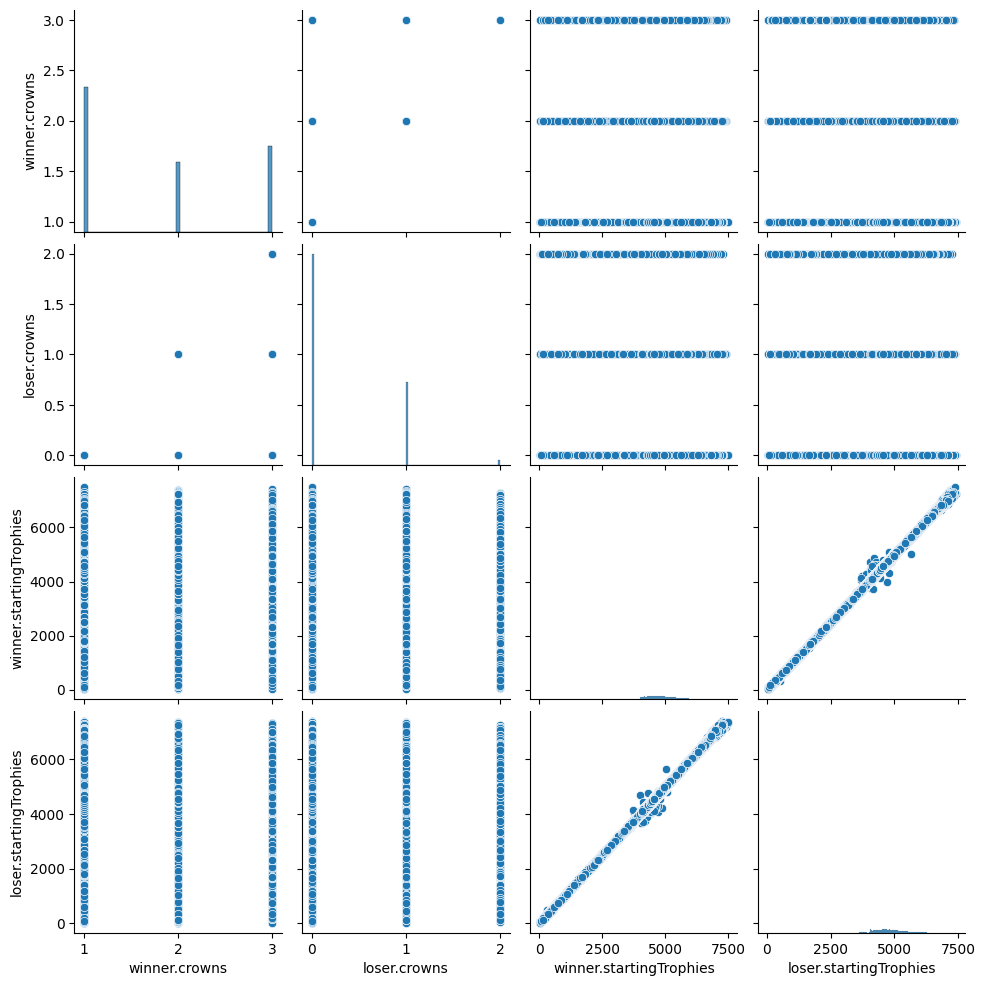

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant columns for the pair plot
pair_plot_columns = ['winner.crowns', 'loser.crowns', 'winner.startingTrophies', 'loser.startingTrophies']

# Create a pair plot
sns.pairplot(df_selected[pair_plot_columns])
plt.show()



Unsupervised Learning


X_encoded shape: (1048575, 1620)
X_encoded shape after handling missing values: (1048575, 1620)
Updated X_encoded shape: (1048575, 1636)


c:\Users\Cdog1\anaconda3\envs\Final\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Predicted Cluster Assignments and Crowns:
         Cluster  winner.crowns  loser.crowns
0              0              2             1
1              0              1             0
2              0              2             0
3              0              2             1
4              0              3             0
...          ...            ...           ...
1048570        0              1             0
1048571        0              1             0
1048572        0              2             1
1048573        0              3             0
1048574        0              3             0

[1048575 rows x 3 columns]


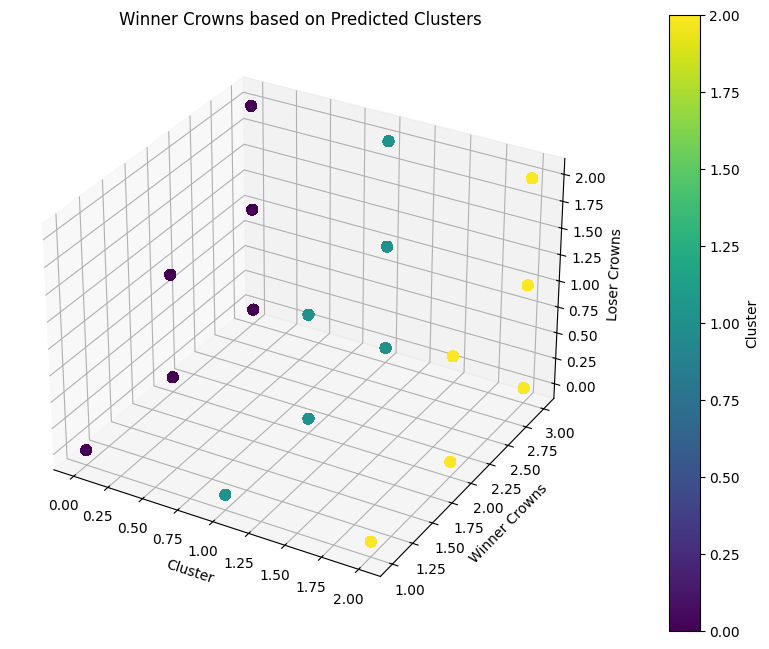

In [4]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load your data
df = pd.read_csv(r'C:\Users\Cdog1\OneDrive\Documents\MEM 680T\Final Visuals\Data_vis\src\data_vis\datapath\500069182.csv')

# Select relevant columns
columns_to_select = ['winner.card1.id', 'winner.card1.level', 'winner.card2.id', 'winner.card3.id', 'winner.card4.id',
                      'winner.card5.id', 'winner.card6.id', 'winner.card7.id', 'winner.card8.id',
                      'loser.card1.id', 'loser.card1.level', 'loser.card2.id', 'loser.card3.id', 'loser.card4.id',
                      'loser.card5.id', 'loser.card6.id', 'loser.card7.id', 'loser.card8.id',
                      'winner.startingTrophies', 'loser.startingTrophies', 'winner.crowns', 'loser.crowns']

df_selected = df[columns_to_select]

# Handle missing values
df_selected = df_selected.dropna()

# Separate features
X = df_selected.drop(['winner.crowns', 'loser.crowns'], axis=1)

# Step 1: Identify Categorical Columns
categorical_columns = ['winner.card1.id', 'winner.card2.id', 'winner.card3.id', 'winner.card4.id', 'winner.card5.id',
                        'winner.card6.id', 'winner.card7.id', 'winner.card8.id', 'loser.card1.id', 'loser.card2.id',
                        'loser.card3.id', 'loser.card4.id', 'loser.card5.id', 'loser.card6.id', 'loser.card7.id',
                        'loser.card8.id']

# Step 2: Encode Categorical Data
X_encoded = pd.get_dummies(X, columns=categorical_columns, drop_first=True)

# Print the shape of X_encoded to check if encoding is working
print("X_encoded shape:", X_encoded.shape)

# Step 3: Handle Missing Values (if any)
X_encoded = X_encoded.dropna()

# Print the shape of X_encoded after handling missing values
print("X_encoded shape after handling missing values:", X_encoded.shape)

# Add winner.card1.level and loser.card1.level for levels 1 to 8
for i in range(1, 9):
    X_encoded[f'winner.card1.level_{i}'] = (X['winner.card1.level'] == i).astype(int)
    X_encoded[f'loser.card1.level_{i}'] = (X['loser.card1.level'] == i).astype(int)

# Print the updated shape of X_encoded
print("Updated X_encoded shape:", X_encoded.shape)

# Add winner.card1.level and loser.card1.level to numeric_features
numeric_features = ['winner.startingTrophies', 'loser.startingTrophies']
numeric_features += [f'winner.card1.level_{i}' for i in range(1, 9)]
numeric_features += [f'loser.card1.level_{i}' for i in range(1, 9)]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded[numeric_features])

# Use K-Means clustering
n_clusters = 3  # You can adjust the number of clusters based on your data
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
X_clusters = kmeans.fit_predict(X_scaled)

# Add cluster assignments to the original data
df_selected['Cluster'] = X_clusters

# Print the predicted cluster assignments and crowns
print("Predicted Cluster Assignments and Crowns:")
print(df_selected[['Cluster', 'winner.crowns', 'loser.crowns']])

# Scatter plot for winner crowns based on cluster assignments
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(X_clusters, df_selected['winner.crowns'], df_selected['loser.crowns'], c=X_clusters, cmap='viridis', s=50)

ax.set_xlabel('Cluster')
ax.set_ylabel('Winner Crowns')
ax.set_zlabel('Loser Crowns')
ax.set_title('Winner Crowns based on Predicted Clusters')

# Add a colorbar
colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Cluster')

plt.show()
